In [1]:
!pip install ultralytics roboflow opencv-python matplotlib seaborn


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="XXXXXXXXXXXXXXXXXXXXX")
project = rf.workspace("ds-projects").project("wsiroisimages-jrhgs")
version = project.version(1)
dataset = version.download("yolov8")
                

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to wsiroisImages-1 in yolov8:: 100%|███████████████| 3767/3767 [00:04<00:00, 772.30it/s]


In [7]:
!dir /s /b data.yaml

C:\Users\acer\Downloads\wsiroisImages-1\data.yaml


In [8]:
#from ultralytics import YOLO

# 1. Load the YOLO11 Small model (optimized for precision over the Nano model)
#model = YOLO("yolo11s.pt") 

# 2. Start training using your local Windows path
# Note the 'r' before the string—this tells Python it's a "Raw" string to handle backslashes
#data_path = r"C:\Users\acer\Downloads\wsiroisImages-1\data.yaml"
###
#model.train(
#    data=data_path,
#    epochs=100,             # Cancer detection requires high convergence (100 is a good baseline)
#    imgsz=640,              # Increased resolution to detect smaller cellular features
#    batch=-1,               # "Auto-batch": Finds the maximum size your GPU (Acer laptop) can handle
#    optimizer="SGD",        # Standard for medical research; better at generalizing to new patient data
#    lr0=0.01,               # Initial learning rate for stable training
#    patience=25,            # Stops early if no improvement for 25 epochs to prevent overfitting
#    augment=True,           # Randomly flips/rotates images—crucial for small medical datasets
#    device=0,               # Uses your primary GPU
#    workers=0               # Set to 0 on Windows to avoid "BrokenPipe" multiprocessing errors
)

New https://pypi.org/project/ultralytics/8.4.9 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.249  Python-3.13.3 torch-2.9.1+cpu 


ValueError: Invalid CUDA 'device=0' requested. Use 'device=cpu' or pass valid CUDA device(s) if available, i.e. 'device=0' or 'device=0,1,2,3' for Multi-GPU.

torch.cuda.is_available(): False
torch.cuda.device_count(): 0
os.environ['CUDA_VISIBLE_DEVICES']: None
See https://pytorch.org/get-started/locally/ for up-to-date torch install instructions if no CUDA devices are seen by torch.


In [2]:
import torch
import sys

print(f"Python version: {sys.version}")
print(f"Is CUDA available? {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
else:
    print("STILL ON CPU - We may need to check your NVIDIA Driver version.")

Python version: 3.13.3 (tags/v3.13.3:6280bb5, Apr  8 2025, 14:47:33) [MSC v.1943 64 bit (AMD64)]
Is CUDA available? True
GPU Name: NVIDIA GeForce RTX 3050 Laptop GPU


In [24]:
from ultralytics import YOLO

# Load pretrained YOLOv8 nano
model = YOLO("yolov8n.pt")

# Train
model.train(
    data=r"C:\Users\acer\Downloads\wsiroisImages-1\data.yaml",
    epochs=30,
    imgsz=512,
    batch=16,
    optimizer="AdamW",
    lr0=1e-3,
    patience=10,
    device=0,
    workers=2
)


New https://pypi.org/project/ultralytics/8.4.9 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.249  Python-3.13.3 torch-2.10.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\acer\Downloads\wsiroisImages-1\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, n

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001838CF6BE70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [25]:
model.val()

Ultralytics 8.3.249  Python-3.13.3 torch-2.10.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 27.214.1 MB/s, size: 10.0 KB)
val: Scanning C:\Users\acer\Downloads\wsiroisImages-1\valid\labels.cache... 376 images, 146 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 376/376 330.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 1.6it/s 15.0s0.3s
                   all        376       6662      0.669      0.591      0.642      0.413
Speed: 7.0ms preprocess, 8.8ms inference, 0.0ms loss, 9.4ms postprocess per image
Results saved to C:\Users\acer\Downloads\runs\detect\val5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000183787F8590>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [26]:
from ultralytics import YOLO

# 1. Load your trained model (pointing to your actual Windows path)
# Note: Ensure 'train' matches your actual folder name (e.g., 'train', 'train2', etc.)
model = YOLO(r"C:\Users\acer\Downloads\runs\detect\train3\weights\best.pt") 

# 2. Run prediction with Windows-safe paths and medical optimizations
results = model.predict(
    source=r"C:\Users\acer\Downloads\wsiroisImages-1\valid\images", 
    conf=0.15,        # Lowered slightly for cancer detection (better to see 'uncertain' hits)
    iou=0.45,         # Adjusted IOU to handle overlapping cells/clusters
    save=True,        # Saves the images with boxes drawn on them
    save_txt=True,    # Saves the coordinates in a .txt file (useful for analysis)
    save_conf=True,   # Saves the confidence scores in the .txt files
    line_width=1,     # Thinner lines are better for small objects like cells
    augment=True      # Uses "Test Time Augmentation" for higher accuracy
)

print(f"Results saved to: {results[0].save_dir}")


image 1/376 C:\Users\acer\Downloads\wsiroisImages-1\valid\images\100B_-35129-6567-36429-7757-_png.rf.e4d783761c61b36d2ed896df0400b11b.jpg: 480x512 30 lymphocytes and plasma cellss, 166.6ms
image 2/376 C:\Users\acer\Downloads\wsiroisImages-1\valid\images\134B_-52914-12263-54149-13444-_png.rf.17609e41ca5d70f02ec4f08b841c0b7b.jpg: 512x512 92 lymphocytes and plasma cellss, 106.5ms
image 3/376 C:\Users\acer\Downloads\wsiroisImages-1\valid\images\136B_-73791-8482-75066-9666-_png.rf.cad150141dd7bc3de80448cdd00b0c61.jpg: 480x512 9 lymphocytes and plasma cellss, 118.7ms
image 4/376 C:\Users\acer\Downloads\wsiroisImages-1\valid\images\154B_-2199-20514-3357-21703-_png.rf.4fa5222a1f81b2ea4c21729ecea26d14.jpg: 512x512 32 lymphocytes and plasma cellss, 99.7ms
image 5/376 C:\Users\acer\Downloads\wsiroisImages-1\valid\images\181S_-34272-32152-35623-33367-_png.rf.e3bd1e0a6dc635929ab3d6315a817f9f.jpg: 480x512 12 lymphocytes and plasma cellss, 128.4ms
image 6/376 C:\Users\acer\Downloads\wsiroisImages-1\

Found 376 images. Displaying the first 5...


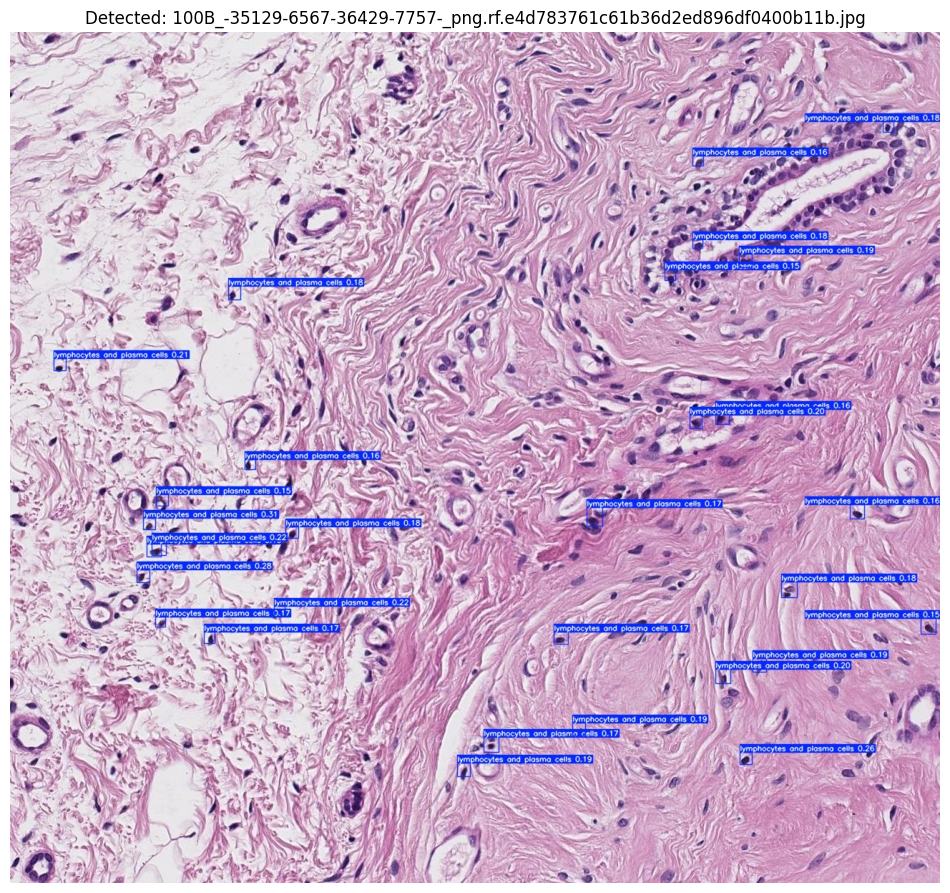

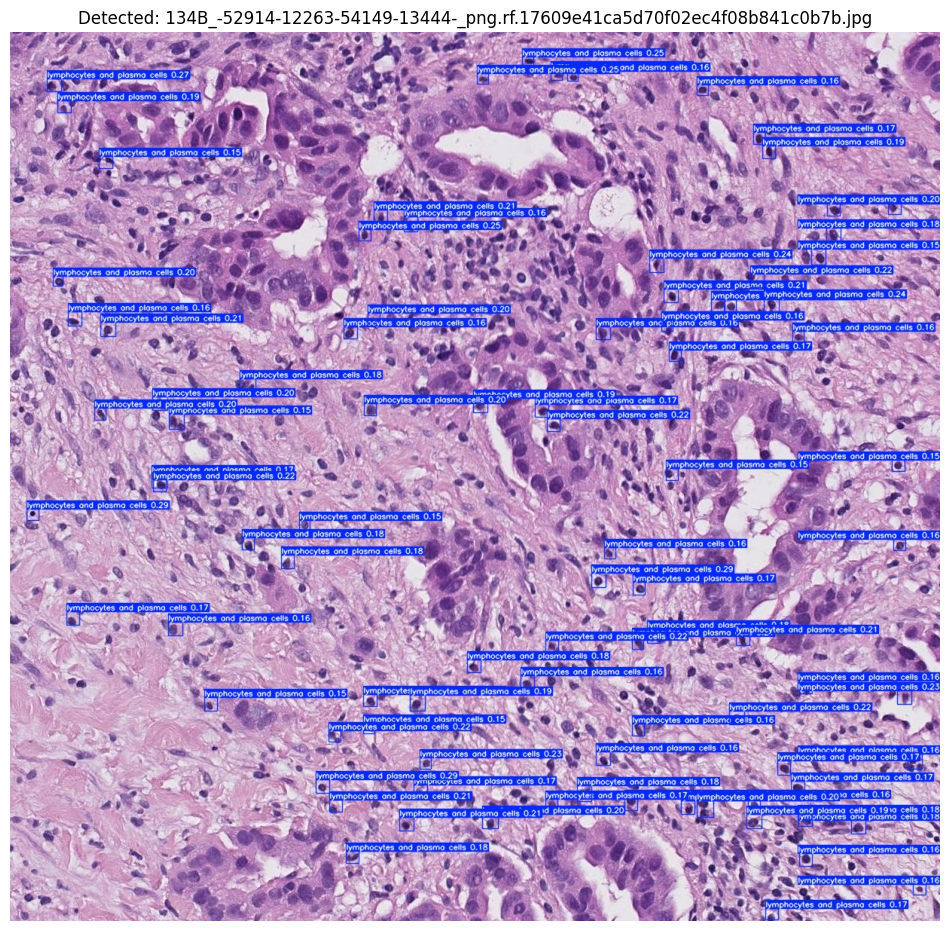

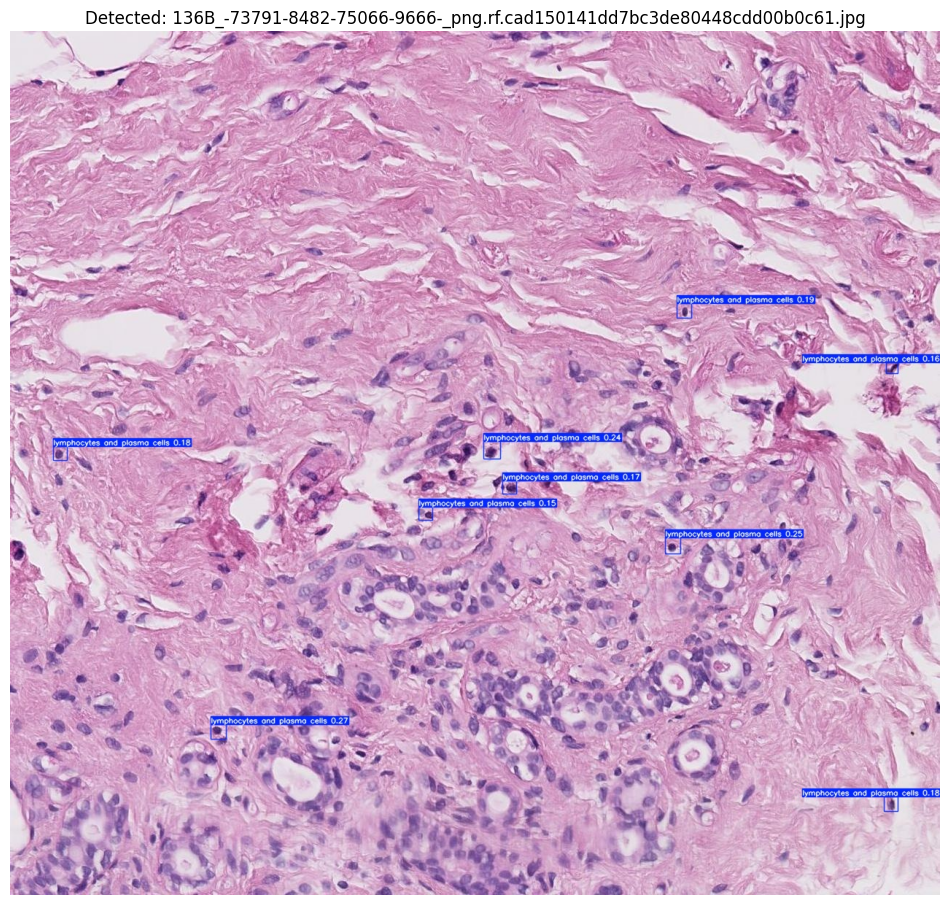

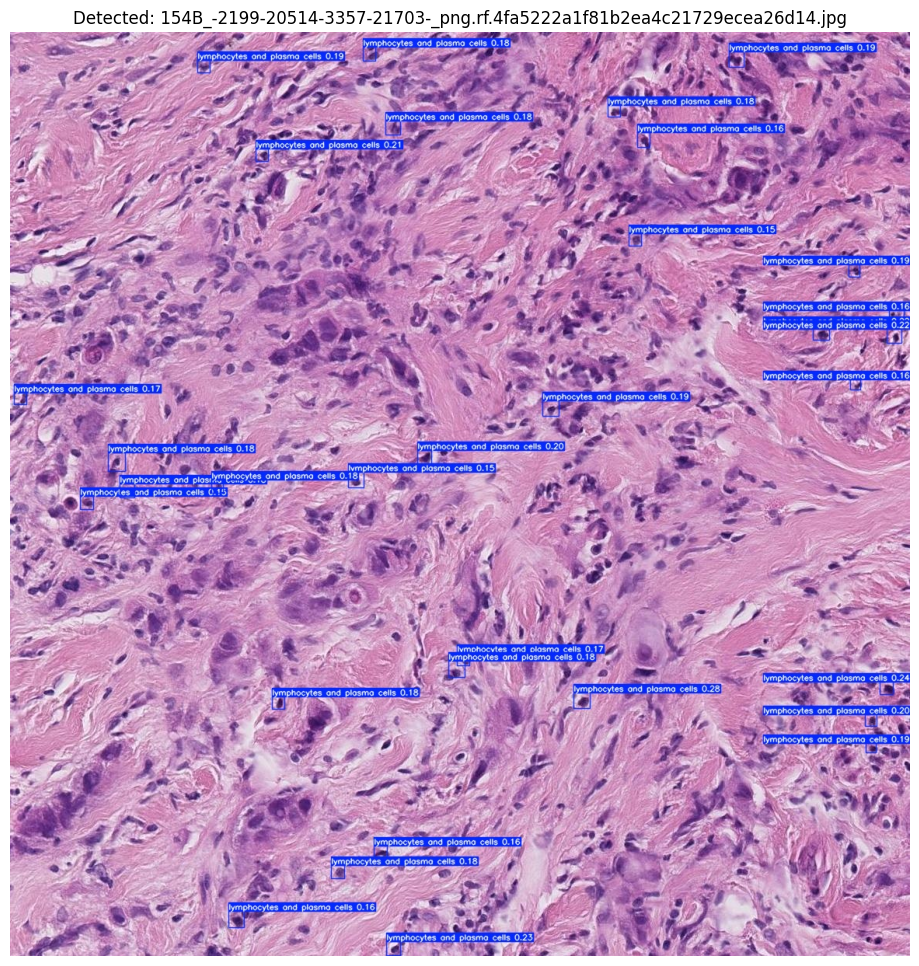

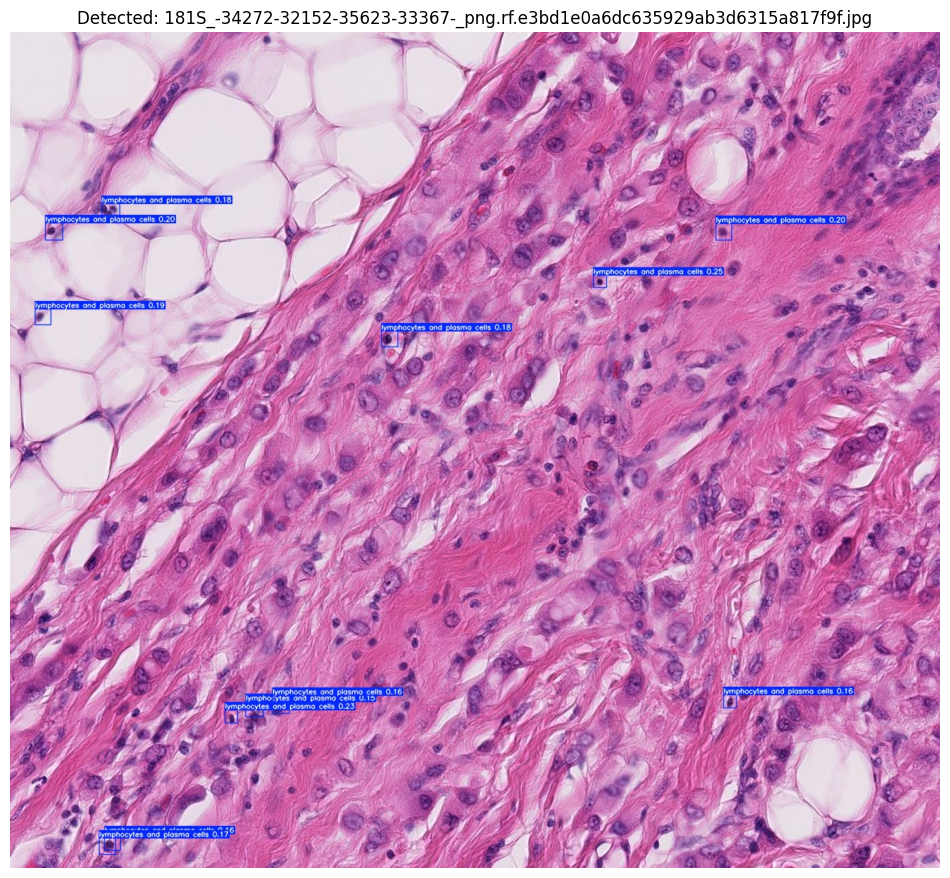

Display loop finished.


In [27]:
import cv2
import glob
import os
import matplotlib.pyplot as plt

# 1. FORCE images to show inside the notebook
%matplotlib inline 

# 2. Use the exact path
predict_path = r"C:\Users\acer\Downloads\runs\detect\predict2"
imgs = glob.glob(os.path.join(predict_path, "*.jpg"))

if not imgs:
    print(f"No images found in {predict_path}. Double check if they are .png or .jpeg!")
else:
    print(f"Found {len(imgs)} images. Displaying the first 5...")
    
    for img_path in imgs[:5]:
        # Use a context manager to ensure the plot is handled correctly
        plt.figure(figsize=(12, 12))
        
        im = cv2.imread(img_path)
        if im is None:
            print(f"Could not read: {img_path}")
            continue
            
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        
        plt.imshow(im)
        plt.title(f"Detected: {os.path.basename(img_path)}")
        plt.axis("off")
        
        # 3. CRUCIAL: This forces the window to render the pixels NOW
        plt.show() 
        
        # 4. Clear the memory so it doesn't crash your notebook
        plt.close()

print("Display loop finished.")

In [30]:
import pandas as pd

# Path to the labels folder you just created
label_path = r"C:\Users\acer\Downloads\runs\detect\predict2\labels"
label_files = glob.glob(os.path.join(label_path, "*.txt"))

data = []
for file in label_files:
    with open(file, 'r') as f:
        lines = f.readlines()
        # Count how many cancer cells are in this specific image
        data.append({"filename": os.path.basename(file), "count": len(lines)})

df = pd.DataFrame(data)

print(f"Total Detections: {df['count'].sum()}")
print(f"Average Detections per Image: {df['count'].mean():.2f}")
print(f"Image with most detections: {df.loc[df['count'].idxmax(), 'filename']} ({df['count'].max()} cells)")

Total Detections: 8616
Average Detections per Image: 30.02
Image with most detections: TCGA-AO-A0J4-01Z-00-DX1-2EFC978E-8DF5-4254-9598-C0910B17C5C8_-17436-10877-17718-11148-_png.rf.430c6bd2584cf8c415a977dbbaaad8bd.txt (300 cells)


In [33]:
from ultralytics import YOLO

# 1. Load your best trained model
model = YOLO(r"C:\Users\acer\Downloads\runs\detect\train3\weights\best.pt")

# 2. Run validation
# This will automatically use the 'val' path from your data.yaml
metrics = model.val()

# 3. Print the Key Medical Metrics
print("--- Medical Detection Metrics ---")
print(f"Precision: {metrics.results_dict['metrics/precision(B)']:.4f}")
print(f"Recall:    {metrics.results_dict['metrics/recall(B)']:.4f}")
print(f"F1-Score:  {metrics.box.f1.mean():.4f}")

Ultralytics 8.3.249  Python-3.13.3 torch-2.10.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 19.93.0 MB/s, size: 6.2 KB)
val: Scanning C:\Users\acer\Downloads\wsiroisImages-1\valid\labels.cache... 376 images, 146 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 376/376 373.3Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 1.8it/s 13.3s0.2s
                   all        376       6662      0.669      0.591      0.642      0.413
Speed: 1.7ms preprocess, 6.0ms inference, 0.0ms loss, 6.5ms postprocess per image
Results saved to C:\Users\acer\Downloads\runs\detect\val9
--- Medical Detection Metrics ---
Precision: 0.6690
Recall:    0.5914
F1-Score:  0.6278
